In [1]:
import numpy as np 
import matplotlib.pyplot as plt 
import pandas as pd
# import lightkurve as lk
# import exoplanet as xo
# import matplotlib.animation as anim
# from astropy.timeseries import BoxLeastSquares
# from astropy.timeseries import TimeSeries
#from astropy import units as u
# from scipy import signal
import rebound
from scipy import stats
# import h5py

<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


In [ ]:
p1=Elements(m=2.5422162292092204e-6,
    P=224.70078014619864,
    t0=3503.765349062694,
    ecosω=-0.003,
    esinω=-0.006,
    I=pi/2,
    Ω=0.0)
p2=Elements(m=3.0256056455411807e-6,
    P=365.2564540136157,
    t0=3624.4021734758985,
    ecosω=0.011,
    esinω=0.012,
    I=pi/2,
    Ω=0.0)
moon=Elements(m=0.012*(p2.m),
    P=27.3,
    t0=3624.3949611424468,
    e=0.055,
    I=(pi/2)-deg2rad(5),
    Ω=deg2rad(60))

In [25]:
sim=rebound.Simulation()
sim.units=('AU','days','Msun')
sim.add(m=1)
sim.add(m=3.0256056455411807e-6,P=365.2564540136157,inc=np.pi/2,Omega=0.0,omega=0.8288490587889792,e = 0.016278820596099707)
sim.add(primary=sim.particles[1],m=(0.012*3.0256056455411807e-6),P=27.3,inc=np.pi/2,Omega=0.0,omega=0.8288490587889792,e = 0.055)
sim.move_to_com()

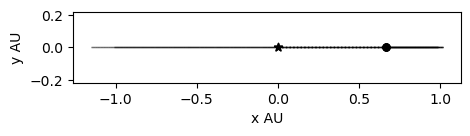

In [28]:

op=rebound.OrbitPlot(sim,unitlabel="AU",periastron=True)

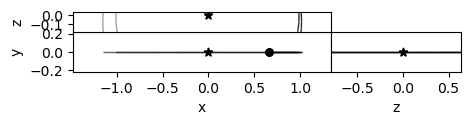

In [33]:
ops = rebound.OrbitPlotSet(sim)

In [26]:

os=sim.orbits()
sim.integrator="whfast"
sim.dt=0.05
Nout=10
tmax=20*10
Nbodies=2
ecc=np.zeros((Nbodies,Nout))
long=np.zeros((Nbodies,Nout))
times = np.linspce(0.,tmax,Nout)
ps=sim.particles

for i,time in enumerate(times):
    sim.integrate(time)
    os=sim.orbits()
    for j in range(Nbodies):
        ecc[j][i] = os[j].e
        long[j][i] = os[j].l
    

AttributeError: 'Simulation' object has no attribute 'orbits'

In [15]:
def evecs_2_omega(evec1,evec2):
    e = np.sqrt(evec1**2 + evec1**2)
    return np.arctan2(evec2/e,evec1/e) 
#     print(np.array(res))
evecs_2_omega(0.011,0.012)

0.8288490587889792

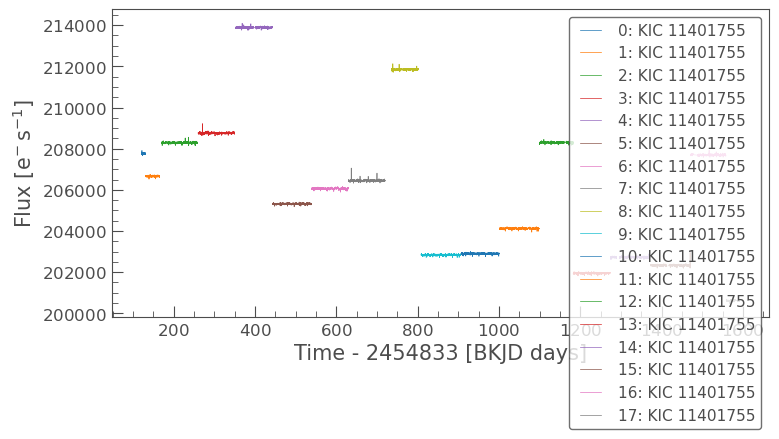

In [3]:
# https://docs.lightkurve.org/tutorials/3-science-examples/exoplanets-identifying-transiting-planet-signals.html
# Search for Kepler observations of Kepler-36
search_result = lk.search_lightcurve('Kepler-36', author='Kepler', cadence='long')
# Download all available Kepler light curves
lc_collection = search_result.download_all()
lc_collection.plot();

/opt/anaconda3/lib/python3.9/site-packages/lightkurve/search.py:423: LightkurveWarning: Warning: 2 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


NameError: name 'period' is not defined

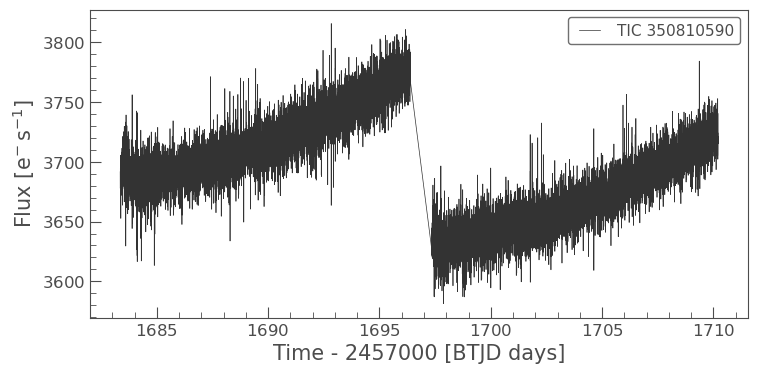

In [2]:
all_result=lk.search_targetpixelfile('Kepler-36',mission="TESS")
tpf=all_result[:2].download()
tpf_lc=tpf.to_lightcurve()
tpf_lc.plot()
# Download all available Kepler, TESS, and K-2 light curves
# lc_collection = search_result.download_all()
# # lc_collection.plot();
# tpf_bls=tpf_lc.to_periodogram(method='bls', period=period, frequency_factor=500);
# tpf_bls.plot()

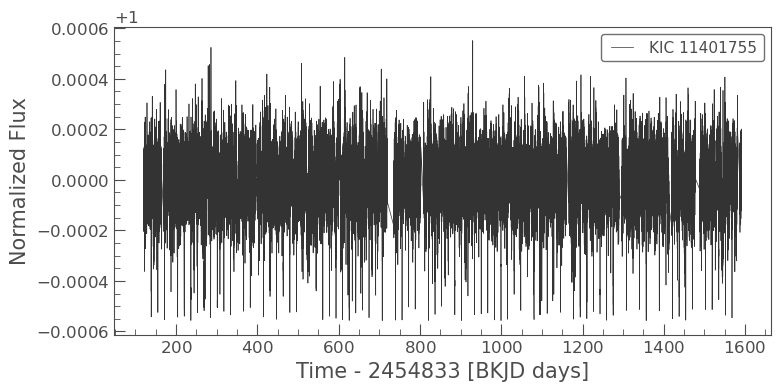

In [4]:
# Combine multiple obs into single LC object & Flatten the light curve
lc = lc_collection.stitch().flatten(window_length=901).remove_outliers()
lc.plot();

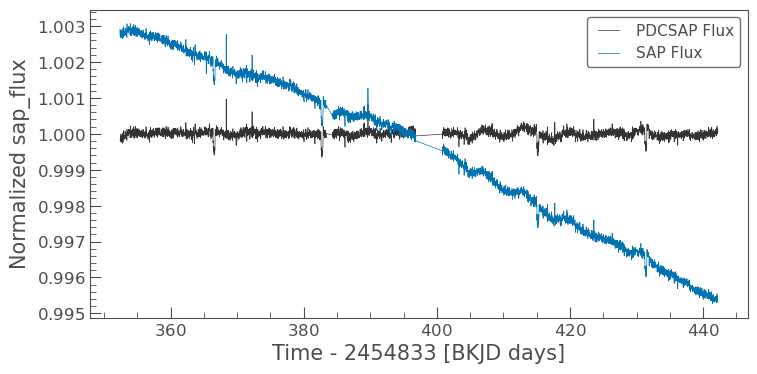

In [5]:
lc_Q4=lc_collection[4]
ax = lc_Q4.plot(column='pdcsap_flux', label='PDCSAP Flux', normalize=True)
lc_Q4.plot(column='sap_flux', label='SAP Flux', normalize=True, ax=ax);

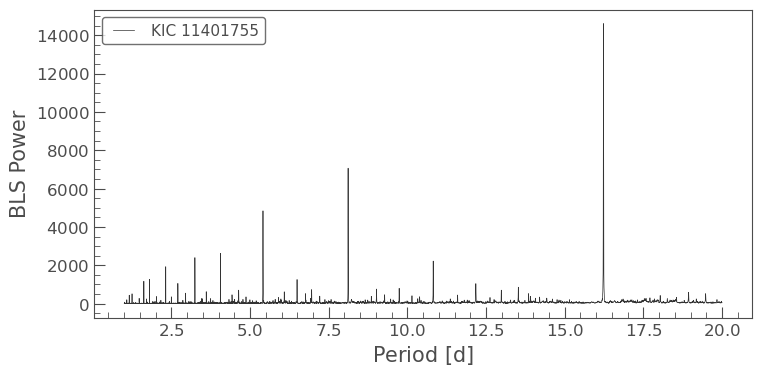

In [6]:
# Create array of periods to search
period = np.linspace(1, 20, 10000)
# Create a BLSPeriodogram
bls = lc.to_periodogram(method='bls', period=period, frequency_factor=500);
bls.plot();

In [7]:
planet_b_period = bls.period_at_max_power
planet_b_t0 = bls.transit_time_at_max_power
planet_b_dur = bls.duration_at_max_power
# Check the value for period
planet_b_period

<Quantity 16.23192319 d>

In [8]:
# Create a cadence mask using the BLS parameters:
# Compute which data points are in transit for a given parameter set.
planet_b_mask = bls.get_transit_mask(period=planet_b_period,
                                     transit_time=planet_b_t0,
                                     duration=planet_b_dur)

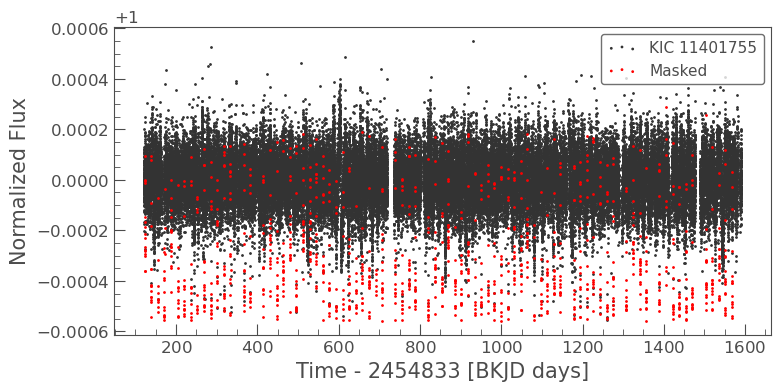

In [9]:
# mask lc to search for additional planets
masked_lc = lc[~planet_b_mask]
ax = masked_lc.scatter();
lc[planet_b_mask].scatter(ax=ax, c='r', label='Masked');

In [10]:
# Create a BLS model using the BLS parameters:
# Compute the transit model at the given period, duration, and phase.
planet_b_model = bls.get_transit_model(period=planet_b_period,
                                       transit_time=planet_b_t0,
                                       duration=planet_b_dur)

In [11]:
stats=bls.compute_stats(period=16.23,duration=0.2,transit_time=122.0)
tt1=stats["transit_times"].value

In [6]:
def regress(tt,per):
    ntrans=np.round(np.linspace(0,len(tt),len(tt)))
    A=np.vstack([ntrans, np.ones(len(tt))]).T
    per, t0 = np.linalg.lstsq(A,tt)[0]
    return per,t0
# per1,t01=regress(tt1,16.23)

In [228]:
per1,t01
# tcalc=16.2 *np.arange(0,len(tt1)) + tt1[0];tcalc

(15.962472527472523, 125.92373626373617)

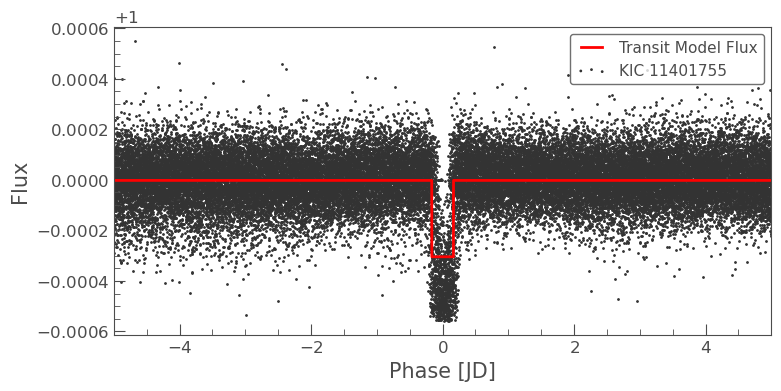

In [12]:
ax = lc.fold(planet_b_period, planet_b_t0).scatter()
planet_b_model.fold(planet_b_period, planet_b_t0).plot(ax=ax, c='r', lw=2)
ax.set_xlim(-5, 5);

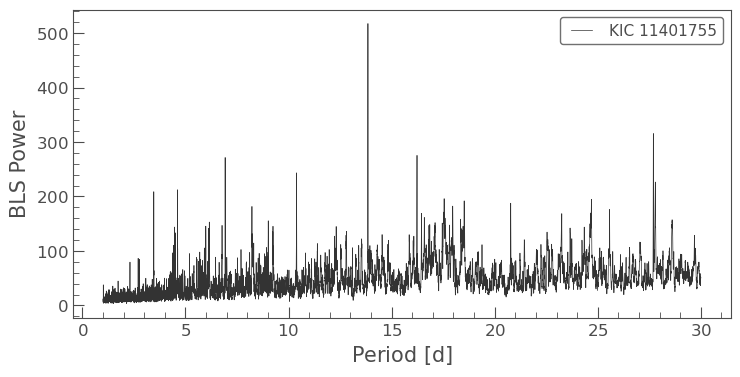

In [116]:
period = np.linspace(1, 30, 10000)
bls = masked_lc.to_periodogram('bls', period=period, frequency_factor=500)
bls.plot();

In [13]:
planet_c_period = bls.period_at_max_power
planet_c_t0 = bls.transit_time_at_max_power
planet_c_dur = bls.duration_at_max_power
# Check the value for period
planet_c_period

<Quantity 16.23192319 d>

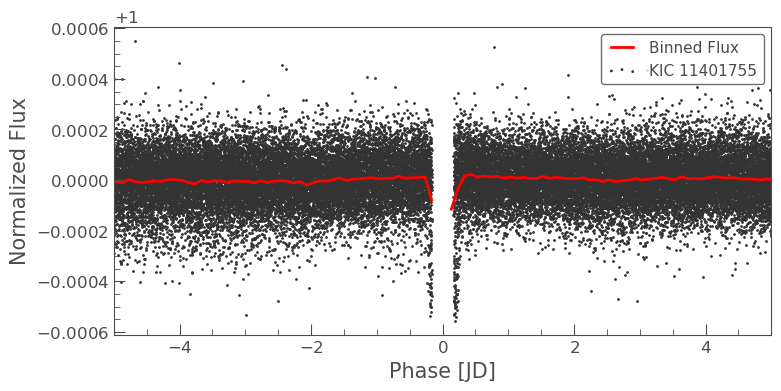

In [14]:
# when the BLS period grid was 1-300 days, found max power at 41.548455 days.
ax = masked_lc.fold(planet_c_period, planet_c_t0).scatter()
masked_lc.fold(planet_c_period, planet_c_t0).bin(.1).plot(ax=ax, c='r', lw=2,
                                                          label='Binned Flux')
ax.set_xlim(-5, 5); 

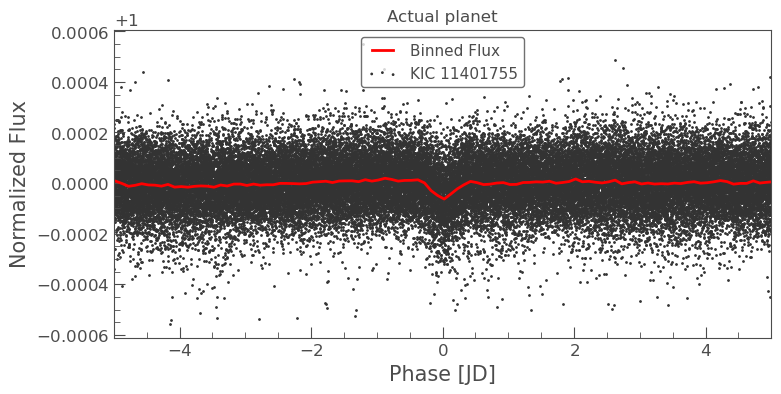

In [119]:
ax = masked_lc.fold(planet_c_period, planet_c_t0).scatter()
masked_lc.fold(planet_c_period, planet_c_t0).bin(.1).plot(ax=ax, c='r', lw=2,
                                                          label='Binned Flux')
ax.set_title("Actual planet")
ax.set_xlim(-5, 5); 

In [190]:
# planet_b_t0,planet_c_t0, planet_b_dur,planet_c_dur
planet_c_model = bls.get_transit_model(period=planet_c_period,
                                       transit_time=planet_c_t0,
                                       duration=planet_c_dur)

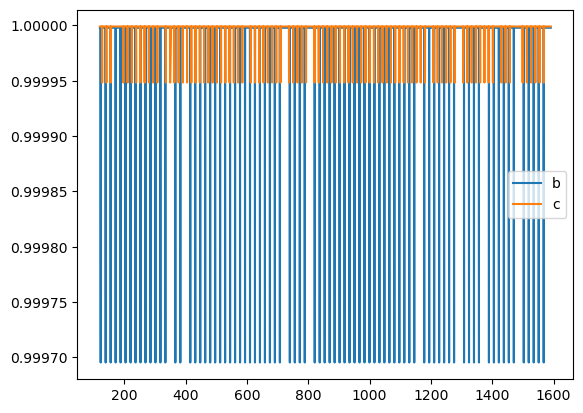

In [192]:
plt.plot(planet_b_model['time'].value,planet_b_model['flux'].value,label="b")
plt.plot(planet_c_model['time'].value,planet_c_model['flux'].value,label="c")
plt.legend()
# planet_b_model['time'].value

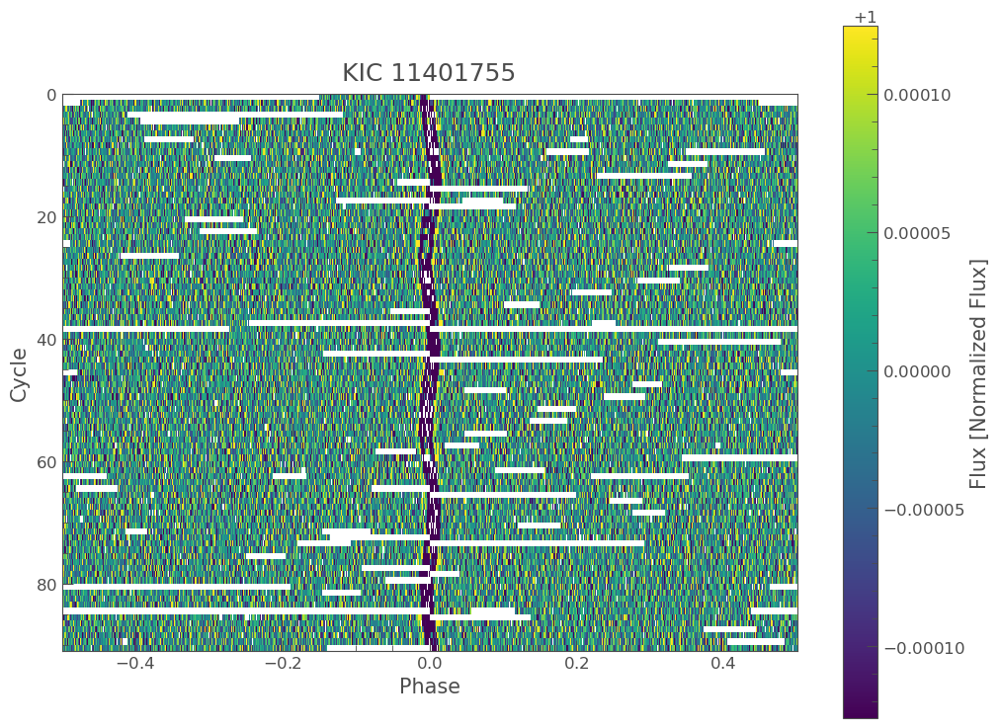

In [123]:
clc = lc.flatten(21)
folded_lc = clc.fold(period=planet_b_period, epoch_time=planet_b_t0)
folded_lc.plot_river();

## Want to fit the actual light curve.
- simulated Earth and Venus transiting the Sun with nyear=20 and 2 min cadence in days
- saved the lc from Photodynamics.jl to a .h5 file. 
- can i retrieve ingress times to get radius ratios ? 

In [4]:
import h5py
f = h5py.File("test/photodynamics_model.h5", "r")
group = f['lc']
# Checkout what keys are inside the group.
for key in group.keys():
    print(key)
# Get relevant info:
flux=group['flux'][()]
tobs=group['tobs'][()] #* u.day
tt1=group['tt1'][()]
tt2=group['tt2'][()]
count=group['count'][()]
# Need to close file when done.
# f.close() 

count
dt
elements
flux
fobs
rstar
tobs
tt1
tt2
u_n


In [18]:
tt1,tt2

(array([ 133.25427114,  357.95418238,  582.65423316,  807.3548544 ,
        1032.05627011, 1256.75587622, 1481.45620199, 1706.16286588,
        1930.86383415, 2155.56252115, 2380.26050497, 2604.96075441,
        2829.66806673, 3054.36936426, 3279.06923144, 3503.76912181,
        3728.46973712, 3953.17132867, 4177.87101235, 4402.57134605,
        4627.27780188, 4851.97874475, 5076.67743366, 5301.37542861,
        5526.07566471, 5750.78312182, 5975.48443501, 6200.18425645,
        6424.88399323, 6649.58460217, 6874.28637338, 7098.98613424,
           0.        ,    0.        ,    0.        ,    0.        ]),
 array([ 337.09281149,  702.35162641, 1067.60904246, 1432.86500592,
        1798.11591944, 2163.37499075, 2528.63424319, 2893.88434047,
        3259.13969755, 3624.39866488, 3989.65588574, 4354.91174755,
        4720.16293404, 5085.42209539, 5450.68126564, 5815.93117128,
        6181.18661459, 6546.44572359, 6911.70274254, 7276.95850654,
           0.        ,    0.        ,    0.   

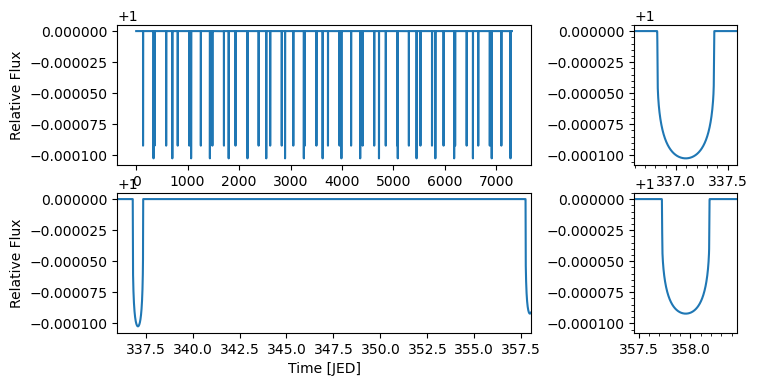

In [53]:
fig=plt.figure(figsize=(8,4))
gs=fig.add_gridspec(2,2,width_ratios=[4, 1], height_ratios=[1, 1],wspace=0.4)
ax1 = fig.add_subplot(gs[0])
# plt.subplot(211)
ax1.plot(tobs,flux+1)
ax1.set_xlabel("Time [JED]")
ax1.set_ylabel("Relative Flux")
ax2 = fig.add_subplot(gs[2])
# plt.subplot(212)
ax2.plot(tobs,flux+1)
ax2.set_xlim(336,358)
plt.xlabel("Time [JED]")
plt.ylabel("Relative Flux")
ax3 = fig.add_subplot(gs[1])
ax3.plot(tobs,flux+1)
ax3.set_xlim(tt2[0]-0.5,tt2[0]+0.5)
ax3.minorticks_on()
ax4 = fig.add_subplot(gs[3])
ax4.plot(tobs,flux+1)
ax4.set_xlim(tt1[1]-0.5,tt1[1]+0.5)
ax4.minorticks_on()

In [13]:
ntrans1=count[1] ; nt1=np.linspace(0, ntrans1-1,ntrans1)
ntrans2=count[2] ; nt2=np.linspace(0, ntrans2-1,ntrans2)
# Estimate ephemeris based on transit times
A1 = np.vstack([nt1, np.ones(ntrans1)]).T
A2 = np.vstack([nt2, np.ones(ntrans2)]).T
per1, t01 = np.linalg.lstsq(A1, tt1[0:ntrans1],rcond=None)[0]
per2, t02 = np.linalg.lstsq(A2, tt2[0:ntrans2],rcond=None)[0]
print("Estimated period [in days] for planet 1: ",per1," t0: ",t01)
print("Estimated period [in days] for planet 2: ",per2," t0: ",t02)

Estimated period [in days] for planet 1:  224.70113675838647  t0:  133.25217925488394
Estimated period [in days] for planet 2:  365.25590515633206  t0:  337.095152489519


In [142]:
30/3600/24
dist=stats.norm(0,0.0025)
r1=dist.rvs(len(flux))
time_smooth=np.empty(1)
flux_smooth=np.empty(1)
def smooth_data(tobs,flux,flux_err):
    nobs=len(tobs)
    bin_size=20
    bins=np.array((nobs - bin_size)/bin_size).astype(int)
    for i in range(0,5):
        first=i*bin_size +1
        second=(first+bin_size) -1
#         print("first",first,"second",second)
        print(np.mean(tobs[first:second]))
    
        np.append(time_smooth,np.mean(tobs[first:second]))
        np.append(flux_smooth,np.mean(flux[first:second]))
        print(time_smooth,flux_smooth)
    return 
smooth_data(tobs,flux+1,r1)
# A=np.array(1)

0.01388888888888889
[0.0025] [0.0025]
0.04166666666666667
[0.0025] [0.0025]
0.06944444444444443
[0.0025] [0.0025]
0.09722222222222222
[0.0025] [0.0025]
0.125
[0.0025] [0.0025]


In [138]:
flux_smooth

array([0.0025])

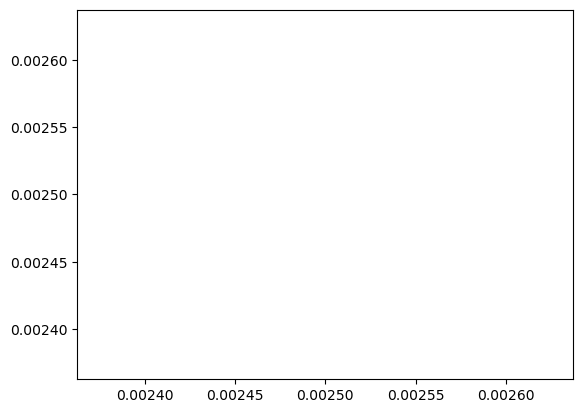

In [131]:

# nt1# t01-133.2542711400717,t02-337.09281149247084
flux_sm
# plt.plot(tobs,r1+flux+1,".")
plt.plot(time_smooth,flux_smooth,color="orange")

In [59]:
# # Difference in consecutive periods and taking the first time
# per1=tt1[1]-tt1[0] ; per2=tt2[1]-tt2[0]
# print("Actual period [in days] for planet 1: ",per1," t0: ",tt1[0])
# print("Actual period [in days] for planet 2: ",per2," t0: ",tt2[0])

Actual period [in days] for planet 1:  224.69991123877867  t0:  133.2542711400717
Actual period [in days] for planet 2:  365.2588149220907  t0:  337.09281149247084


Text(0.02, 0.5, 'TTVs [min]')

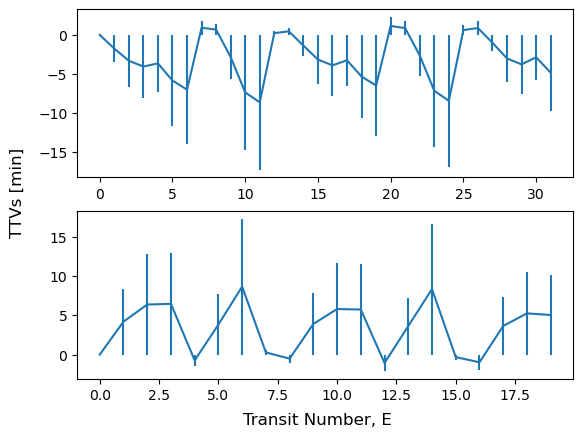

In [56]:
# Get ttvs based on actual ephemeris
ttv1=(tt1[0:ntrans1] - tt1[0] - per1 * nt1)*24*60
ttv2=(tt2[0:ntrans2] - tt2[0] - per2 * nt2)*24*60
fig,ax=plt.subplots(2)
t_err=stats.norm(0,30/3600/24)
ax[0].errorbar(range(ntrans1),ttv1,ttv1+t_err.rvs(ntrans1))
ax[1].errorbar(range(ntrans2),ttv2,ttv2+t_err.rvs(ntrans2))
# ax[0].text(0,0.6,"Venus"); ax[1].text(0,-0.6,"Earth")
fig.supxlabel("Transit Number, E")
fig.supylabel("TTVs [min]")

In [186]:
freq,Power=signal.periodogram(ttv1)
print(1/freq[np.argmax(Power)])
# tic=time.clock() #timeit.default_timer()
# toc=time.process_time #timeit.default_timer()
# toc - tic
# model.autoperiod(0.55)

32.0


<Quantity [1.10000000e+00, 1.10000001e+00, 1.10000002e+00, ...,
           3.65216026e+03, 3.65229774e+03, 3.65243523e+03] d>

Text(0.02, 0.5, 'Power')

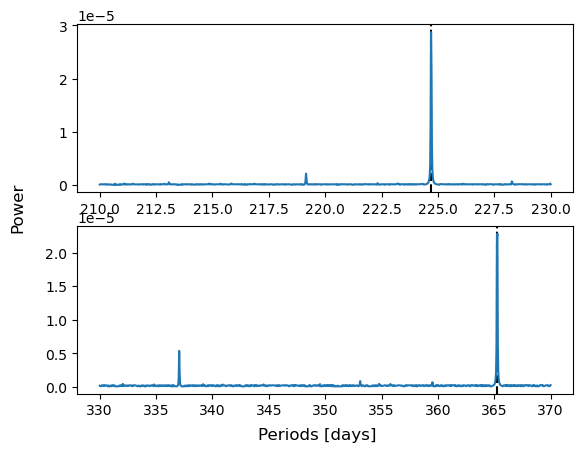

In [20]:
model=BoxLeastSquares(tobs,flux)
periods1 = np.linspace(210, 230, 1000)
periods2 = np.linspace(330, 370, 1000)
results1 = model.power(periods1, 0.5)#*u.day)
results2 = model.power(periods2, 0.5)#*u.day)
fig,ax=plt.subplots(2)
ax[0].axvline(per1,color="k",linestyle="--")
ax[1].axvline(per2,color="k",linestyle="--")
ax[0].plot(periods1,results1.power)
ax[1].plot(periods2,results2.power)
fig.supxlabel("Periods [days]")
fig.supylabel("Power")

In [21]:
max_pow1=np.argmax(results1.power) ; max_pow2=np.argmax(results2.power)
print("Results from BLS search.")
print(results1.period[max_pow1], "day period with transit duration= ",results1.duration[max_pow1])
print(results2.period[max_pow2], "day period with transit duration= ",results2.duration[max_pow2])
# results1.transit_time[max_pow1]

Results from BLS search.
224.6946946946947 day period with transit duration=  0.5
365.27527527527525 day period with transit duration=  0.5


In [22]:
stats1=model.compute_stats(results1.period[max_pow1],results1.duration[max_pow1],results1.transit_time[max_pow1])

stats1


{'transit_times': array([ 133.35      ,  358.04469469,  582.73938939,  807.43408408,
        1032.12877878, 1256.82347347, 1481.51816817, 1706.21286286,
        1930.90755756, 2155.60225225, 2380.29694695, 2604.99164164,
        2829.68633634, 3054.38103103, 3279.07572573, 3503.77042042,
        3728.46511512, 3953.15980981, 4177.8545045 , 4402.5491992 ,
        4627.24389389, 4851.93858859, 5076.63328328, 5301.32797798,
        5526.02267267, 5750.71736737, 5975.41206206, 6200.10675676,
        6424.80145145, 6649.49614615, 6874.19084084, 7098.88553554]),
 'per_transit_count': array([359, 360, 360, 360, 360, 360, 360, 360, 360, 360, 360, 360, 360,
        360, 360, 360, 360, 360, 360, 360, 360, 360, 360, 360, 360, 360,
        360, 360, 360, 360, 360, 360]),
 'per_transit_log_likelihood': array([7.47160207e-07, 7.67024808e-07, 7.89588179e-07, 8.14049992e-07,
        8.41086707e-07, 8.60597526e-07, 8.77186825e-07, 9.20222894e-07,
        9.41739176e-07, 9.55046233e-07, 9.65644520e-07, 

In [23]:
stats2=model.compute_stats(results2.period[max_pow2],results2.duration[max_pow2],results2.transit_time[max_pow2])

stats2

{'transit_times': array([ 336.9       ,  702.17527528, 1067.45055055, 1432.72582583,
        1798.0011011 , 2163.27637638, 2528.55165165, 2893.82692693,
        3259.1022022 , 3624.37747748, 3989.65275275, 4354.92802803,
        4720.2033033 , 5085.47857858, 5450.75385385, 5816.02912913,
        6181.3044044 , 6546.57967968, 6911.85495495, 7277.13023023]),
 'per_transit_count': array([360, 360, 360, 360, 360, 360, 360, 360, 360, 360, 360, 360, 360,
        360, 360, 360, 360, 360, 360, 360]),
 'per_transit_log_likelihood': array([6.19259155e-07, 7.13249227e-07, 8.14511186e-07, 9.23045747e-07,
        1.05820022e-06, 1.14577593e-06, 1.23799413e-06, 1.36731321e-06,
        1.46419169e-06, 1.53397909e-06, 1.55193635e-06, 1.54191308e-06,
        1.45017255e-06, 1.37182176e-06, 1.29044419e-06, 1.15658283e-06,
        1.04138170e-06, 9.52364923e-07, 8.50180743e-07, 7.39654101e-07]),
 'depth': (7.962406781044763e-05, 0.011793187779734307),
 'depth_phased': (-1.9150709080326162e-07, 0.01179319

In [24]:
mask=model.transit_mask(tobs,results2.period[max_pow2],results2.duration[max_pow2],results2.transit_time[max_pow2])

# model_flux=model.model(tobs,results2.period[max_pow2],results2.duration[max_pow2],results2.transit_time[max_pow2])

In [32]:
tt1_noised=r1+tt1[0:ntrans1];tt2_noised=r2+tt2[0:ntrans2]
flux_err=

array([ 133.25409314,  357.95422683,  582.65381796,  807.35455408,
       1032.05592646, 1256.756538  , 1481.45609163, 1706.16303796,
       1930.86341774, 2155.56260162, 2380.26009711, 2604.96119396,
       2829.6679865 , 3054.36986114, 3279.06917054, 3503.76940146,
       3728.46964875, 3953.17186613, 4177.87093166, 4402.57162754,
       4627.27795614, 4851.97856464, 5076.67736959, 5301.37515675,
       5526.07520005, 5750.78349749, 5975.48481479, 6200.18419513,
       6424.88423333, 6649.58423035, 6874.28629034, 7098.9863124 ])

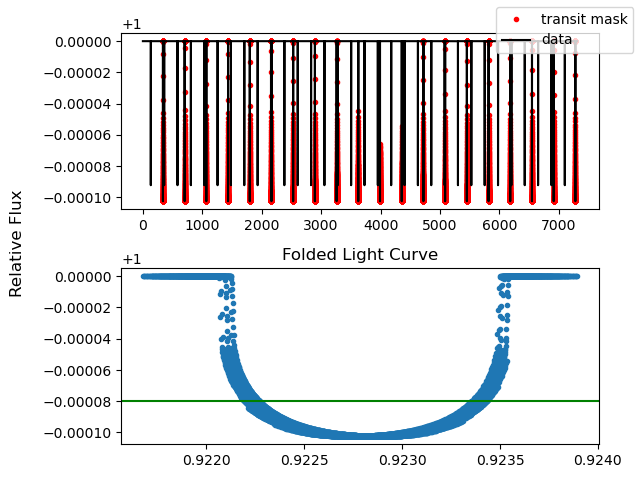

In [278]:
def find_phase(tobs,period):
    t0=tobs[1]
    phi= (tobs - t0)/period - np.floor((tobs - t0)/period) 
    return phi
# phase1=find_phase(tobs,tt1[1]-tt1[0])
phase2=find_phase(tobs,per2)
p1=np.argsort(phase1);p2=np.argsort(phase2)

fig,ax=plt.subplots(2)
ax[0].plot(tobs[mask],flux[mask]+1,".",color="red",label="transit mask")
ax[0].plot(tobs,flux+1,"k",label="data")
# ax[0].plot(tobs,model_flux+1,label="model")
ax[1].set_title("Folded Light Curve")
# ax[1].plot(phase2[p2][mask],flux[p2][mask],".")
ax[1].plot(phase2[mask],flux[mask]+1,".")
ax[1].axhline(1-stats2['depth'][0],color="g")
# ax[1].axhline(1-(stats2['depth'][0]+stats2['depth'][1]),color="g",alpha=0.5)
# ax[1].set_xlim(0.745,0.747)
fig.legend()
fig.supylabel("Relative Flux")
fig.tight_layout()
# plt.plot(phase2[p2],flux[p2]+1 -flux[p1])
# # plt.xlim(0.58,0.6)

/opt/anaconda3/lib/python3.9/site-packages/astropy/units/quantity.py:666: RuntimeWarning: divide by zero encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/opt/anaconda3/lib/python3.9/site-packages/astropy/units/quantity.py:666: RuntimeWarning: invalid value encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/opt/anaconda3/lib/python3.9/site-packages/astropy/units/quantity.py:666: RuntimeWarning: invalid value encountered in subtract
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


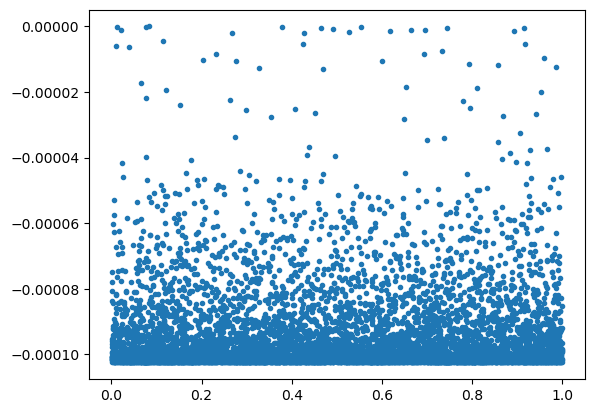

In [285]:
# Get masked lc 
masked_flux=flux[mask]
masked_tobs=tobs[mask]
phase=find_phase(masked_tobs,masked_flux)
p=np.argsort(phase)
plt.plot(phase[p],masked_flux[p],".")

In [264]:
def calc_sma(Per)
def calc_b(r_star,a,inc): #impact parameter
    b = (a * cos(inc))/r_star
    return b
def calc_delta(r_planet,r_star): #transit depth
    depth = (r_planet/r_star) **2
    return depth
def calc_t_T(r_planet,r_star,a,inc,P): 
    """
    calculate transit duration from contact I to VI, a=semimajoraxis
    """
    b =  calc_b(r_star,a,inc)
    k = r_planet/r_star
    if (b < r_star + r_planet) and (k > 0):
        t_T = (P/pi)*asin((r_star/a) * sqrt(((1+k)**2 - b**2)/
                (1 - cos(inc)*cos(inc))))
        return t_T
def optimize_LC(model,flux_obs,flux_err):
    chi=np.sum((flux_obs - model)/flux_err**2)
    return chi
optimize_LC(model_flux,flux,30)


1.1443944512997632e-18

In [288]:
# for earth
rp_rstar=0.00917
delta=rp_rstar**2
delta

8.40889e-05

## Plot known planets from NASA archive
- data has pl_bmasselim=0 
- old_data has pl_bmasselim=0 and trans_flag=1
- new_data has pl_bmasselim=0  ans np>=2

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
data = pd.read_csv("../test/PS_2024.05.29_14.10.50.csv",comment='#')
old_data = pd.read_csv("../test/PS_2024.05.28_17.33.33_all.csv",comment='#')
new_data=pd.read_csv("/Users/bethleelindor/Downloads/PS_2024.12.20_18.35.19.csv",comment='#') #masselim=0

b_data=pd.read_csv("/Users/bethleelindor/Downloads/PS_2024.12.24_11.23.27.csv",comment='#') #bmasselim=0
def names(dataframe):
    for p in dataframe.keys():
        print(format(p))
        
# names(data)

In [21]:
parameters = ['pl_name',
            'pl_bmassj','pl_radj','st_mass','st_rad','pl_eqt',
            'pl_orbper','pl_orbsmax','pl_orbeccen','pl_orbincl',
            'st_met','st_teff','st_age','pl_trandep','st_spectype']
parameter_high = ['pl_name',
                  'pl_bmassjerr1','pl_radjerr1','st_masserr1','st_raderr1','pl_eqterr1',
                  'pl_orbpererr1','pl_orbsmaxerr1','pl_orbeccenerr1','pl_orbinclerr1',
                 'st_metfeerr1','st_tefferr1','st_ageerr1','pl_trandeperr1']
parameter_low = ['pl_name',
                 'pl_bmassjerr2','pl_radjerr2','st_masserr2','st_raderr2','pl_eqterr2',
                  'pl_orbpererr2','pl_orbsmaxerr2','pl_orbeccenerr2','pl_orbinclerr2',
                 'st_metfeerr2','st_tefferr2','st_ageerr2','pl_trandeperr2']

MEARTH = 5.9742e24 #kg 
REARTH = 6.3781e6 #km
MJUP = 1.8986e27 #kg
RJUP = 6.9911e11 #km
MSUN = 1.98892e30 #kg

# Solar System params
ssplanets=["Mercury", "Venus", "Earth", "Mars","Jupiter" ,"Saturn","Uranus","Neptune"]
ssshort=["M","V","E","M","J","S","U","N"]
ssmass = np.array([0.3302, 4.8685, 5.9736, 0.64185, 1898.6, 568.46, 86.832, 102.43]) * 10**24 #kg
ssper = np.array([88.0,224.7,365.2,687.0,4331,10747,30589,59800]) #days
ssecc= [0.205,0.007,0.017,0.094,0.049,0.057,0.046,0.011]
ssrad = [2439.7,6051.8,6371.00,3389.50,69911,58232,25362,24622] #km
ssrad_pm = [1.0,1.0,0.01,0.2,6,6,7,19]

# Real SS data
SS_params=np.array([2.542216e-6,224.70078014619864,3503.765349062694,-0.003 , -0.006 ,
                    3.025605e-6,365.2564540136157,3624.4021734758985, 0.011 , 0.012 ,
                    0.3227e-6,686.980 ,    383.823 ,    0.0403 , 0.0268 ,
                    7.7123786e-4,4210.1287973187655, 603.9841005839645, 0.0131 ,0.0925,
                    2.8420e-4, 10755.5, 892.111, -0.051, 0.014])
# results from p4, 10s 30yrs
mass=np.array([2.3711550332e-6,3.05579929439e-6,2.388339421e-7,0.0010293898])*MSUN/MEARTH
mass_low=np.array([9.630498e-8,6.51563538e-8,5.27821835e-8,9.9416745e-5])*MSUN/MEARTH
mass_high=np.array([9.6903911e-8,6.6593944705e-8,6.73979511e-8,9.73198606e-5])*MSUN/MEARTH
per=np.array([224.7007710446988,365.25646026794807,688.0929985742034, 4345.259220047404])
per_low=np.array([2.63e-6,5.37e-6,1.507,26.37])
per_high=np.array([2.5882e-6,5.418e-6,1.40049,26.64882])

In [6]:
# for error bar shape(2,N): separate - and + values for each bar. All values must be >= 0.
# First row contains the lower errors, the second row contains the upper errors.
# pl_masse	Planet Mass [Earth Mass]	
# Amount of matter contained in the planet, measured in units of masses of the Earth
#(+) pl_masseerr1 (-) pl_masseerr2	pl_masselim
def make_plot(signal_cut):
    other=(data["discoverymethod"]!="Transit") & (data["discoverymethod"]!="Radial Velocity")  & (data["discoverymethod"]!="Transit Timing Variations") 
    mask=data.mask(~other)
    fig,ax = plt.subplots()
    ax.set_xscale('log') 
    ax.set_yscale('log')
#     ax.plot(mask.pl_orbper[signal_cut],mask.pl_bmasse[signal_cut])
    ax.errorbar(mask.pl_orbper[signal_cut],mask.pl_bmasse[signal_cut],
             xerr=[-mask.pl_orbpererr2[signal_cut],mask.pl_orbpererr1[signal_cut]],
            yerr=[-mask.pl_bmasseerr2[signal_cut],mask.pl_bmasseerr1[signal_cut]],
                     fmt=".",alpha=0.75,
                     capsize=2,mfc="white")
    plt.scatter(ssper,ssmass/MEARTH,marker="o",color="black",label="Truth")
    plt.errorbar(per,mass,xerr=[per_low,per_high],
        yerr=[mass_low, mass_high],
                 fmt=".",
                 capsize=5,alpha=0.8,label="This work")
    plt.xlabel("Orbital Period [days]");   plt.ylabel("Planet Mass [M$_{Earth}$]")
    fig.legend()
    plt.show()
    return mask

EA: Could you discard planets in this plot which have masses consistent with zero?  For example, choose a S/N threshold for the lower mass uncertainty of >3-sigma?  The vertical lines which go down to zero are distracting, and these indicate that the mass only has an upper limit, not a measurement.

In [7]:
# want planets in multis , lower error is defined, lower limit isn't zero, 
def make_cut(info):
    signal_cut=((info.pl_bmasse+info.pl_bmasseerr2) > 0.0)  & (info.sy_pnum >=2) & (np.isnan(info.pl_bmasseerr2)==False) & ((info.pl_bmasse+info.pl_bmasseerr2) > (info.pl_bmasseerr2*3)) #(data.pl_bmasse+data.pl_bmasseerr2 > -100)
    return signal_cut
old=data[make_cut(data)].pl_name.unique()
new=new_data[make_cut(new_data)].pl_name.unique()
len(old),len(new) # how did i lose 428 planets?

(1088, 660)

In [18]:
new[np.isin(new,old,invert = True)]

array(['HD 118203 b', 'HD 118203 c', 'HD 25463 b', 'HD 25463 c',
       'HD 42813 b', 'HD 63433 b', 'HD 63433 c', 'HD 75898 c',
       'HIP 8152 b', 'HIP 8152 c', 'Kepler-51 e', 'Kepler-80 g',
       'Kepler-85 b', 'TOI-1294 b', 'TOI-1408 b', 'TOI-1408 c',
       'TOI-1410.01', 'TOI-1450 A b', 'TOI-1798.01', 'TOI-1798.02',
       'TOI-1836 b', 'TOI-2076 b', 'TOI-2458 b', 'TOI-286 b', 'TOI-286 c',
       'TOI-406 c', 'TOI-406.01', 'TOI-4562 b', 'TOI-4562 c', 'TOI-663 b',
       'TOI-663 c'], dtype=object)

In [19]:
old[np.isin(old,new,invert = True)]

array(['24 Sex b', '24 Sex c', '47 UMa b', '47 UMa c', '47 UMa d',
       '61 Vir b', '61 Vir c', '61 Vir d', '7 CMa b', '7 CMa c',
       '75 Cet b', '75 Cet c', 'BD-06 1339 b', 'BD-06 1339 c',
       'BD-08 2823 b', 'BD-08 2823 c', 'BD-11 4672 b', 'BD-11 4672 c',
       'BD-210397 b', 'CoRoT-20 c', 'DMPP-1 b', 'DMPP-1 c', 'DMPP-1 d',
       'DMPP-1 e', 'G 264-012 b', 'G 264-012 c', 'GJ 1002 b', 'GJ 1002 c',
       'GJ 1061 b', 'GJ 1061 c', 'GJ 1061 d', 'GJ 1132 c', 'GJ 1148 b',
       'GJ 1148 c', 'GJ 15 A b', 'GJ 15 A c', 'GJ 163 b', 'GJ 163 c',
       'GJ 163 d', 'GJ 180 b', 'GJ 180 c', 'GJ 180 d', 'GJ 2030 b',
       'GJ 229 A c', 'GJ 229 b', 'GJ 273 b', 'GJ 273 c', 'GJ 3138 b',
       'GJ 3138 c', 'GJ 3138 d', 'GJ 317 c', 'GJ 328 b', 'GJ 328 c',
       'GJ 3293 b', 'GJ 3293 c', 'GJ 3293 d', 'GJ 3293 e', 'GJ 3323 b',
       'GJ 3323 c', 'GJ 3473 c', 'GJ 3512 b', 'GJ 3512 c', 'GJ 357 c',
       'GJ 357 d', 'GJ 367 c', 'GJ 367 d', 'GJ 3929 c', 'GJ 3998 b',
       'GJ 3998 c', 'GJ 41

In [96]:

for i in range(len(old)):
    for j in range(len(new)):
        if old[i]!=new[j]:
#         print()
#         continue
#         elif i
            print(old[i]," ", new[j])
#     end
#     end

14 Her b   14 Her b
2MASS J19383260+4603591 b   2MASS J19383260+4603591 b
55 Cnc b   55 Cnc b
55 Cnc c   55 Cnc c
55 Cnc d   55 Cnc d
55 Cnc e   55 Cnc e
55 Cnc f   55 Cnc f
AU Mic b   AU Mic b
AU Mic c   AU Mic c
AU Mic d   AU Mic d
BD-210397 c   BD-210397 c
CoRoT-20 b   CoRoT-20 b
CoRoT-24 c   CoRoT-24 c
CoRoT-7 b   CoRoT-7 b
CoRoT-7 c   CoRoT-7 c
CoRoT-7 d   CoRoT-7 d
EPIC 220674823 b   EPIC 220674823 b
EPIC 220674823 c   EPIC 220674823 c
EPIC 249893012 b   EPIC 249893012 b
EPIC 249893012 c   EPIC 249893012 c
EPIC 249893012 d   EPIC 249893012 d
GJ 1132 b   GJ 1132 b
GJ 143 b   GJ 143 b
GJ 2030 c   GJ 2030 c
GJ 317 b   GJ 317 b
GJ 3473 b   GJ 3473 b
GJ 357 b   GJ 357 b
GJ 367 b   GJ 367 b
GJ 3929 b   GJ 3929 b
GJ 676 A b   GJ 676 A b
GJ 676 A c   GJ 676 A c
GJ 806 b   GJ 806 b
GJ 876 b   GJ 876 b
GJ 876 c   GJ 876 c
GJ 876 d   GJ 876 d
GJ 876 e   GJ 876 e
GJ 9827 b   GJ 9827 b
GJ 9827 c   GJ 9827 c
GJ 9827 d   GJ 9827 d
HAT-P-11 b   HAT-P-11 b
HAT-P-11 c   HAT-P-11 c
HAT-P-13 b   HAT

Data accessed on  12/29/24


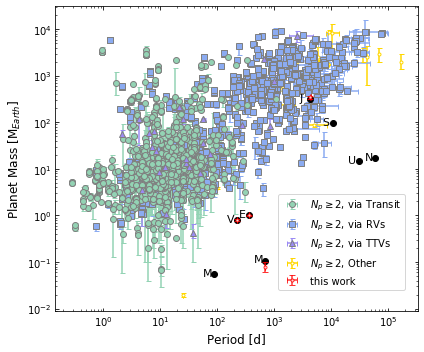

In [23]:
def plot_systems(inf,signal_cut,date_accessed,save_fig=False):
    t=inf["discoverymethod"]=="Transit"
    r=inf["discoverymethod"]=="Radial Velocity"
    tt=inf["discoverymethod"]=="Transit Timing Variations"
    other=(inf["discoverymethod"]!="Transit") & (inf["discoverymethod"]!="Radial Velocity") 
    transits=inf.mask(~t)
    radial=inf.mask(~r)
    ttv=inf.mask(~tt)
    other=(inf["discoverymethod"]!="Transit") & (inf["discoverymethod"]!="Radial Velocity")  & (inf["discoverymethod"]!="Transit Timing Variations") 
    mask=inf.mask(~other)
    font = {'family': 'sans-serif',
    'color':  'black',
    'weight': 'normal',
    'size': 11 }
    fig,ax = plt.subplots(figsize=(6,5))#,dpi=150)
    ax.set_xscale('log') 
    ax.set_yscale('log')
    a0=ax.errorbar(mask.pl_orbper[signal_cut],mask.pl_bmasse[signal_cut],
            xerr=[-mask.pl_orbpererr2[signal_cut],mask.pl_orbpererr1[signal_cut]],
            yerr=[-mask.pl_bmasseerr2[signal_cut],mask.pl_bmasseerr1[signal_cut]],
            fmt=".",color="gold",capsize=2.5,mfc="white",label="$N_p \geq 2$, Other")
    a2=ax.errorbar(radial.pl_orbper[signal_cut],radial.pl_bmasse[signal_cut],
         xerr=[-radial.pl_orbpererr2[signal_cut],radial.pl_orbpererr1[signal_cut]],
        yerr=[-radial.pl_bmasseerr2[signal_cut],radial.pl_bmasseerr1[signal_cut]],
            fmt="s",color='#8babf1',mec="grey",capsize=2.5,label="$N_p \geq 2$, via RVs")
    a1=ax.errorbar(transits.pl_orbper[signal_cut],transits.pl_bmasse[signal_cut],
            xerr=[-transits.pl_orbpererr2[signal_cut],transits.pl_orbpererr1[signal_cut]],
            yerr=[-transits.pl_bmasseerr2[signal_cut],transits.pl_bmasseerr1[signal_cut]],
            fmt="o",color='#93d3b4',mec="grey",capsize=2.5,label="$N_p \geq 2$, via Transit")
    a3=ax.errorbar(ttv.pl_orbper[signal_cut],ttv.pl_bmasse[signal_cut],
         xerr=[-ttv.pl_orbpererr2[signal_cut],ttv.pl_orbpererr1[signal_cut]],
        yerr=[-ttv.pl_bmasseerr2[signal_cut],ttv.pl_bmasseerr1[signal_cut]],
         fmt="^",color='#9b8bf4',mec="grey",capsize=2.5,label="$N_p \geq 2$, via TTVs")
    a4=plt.errorbar(per,mass,xerr=[per_low,per_high],
        yerr=[mass_low, mass_high],color='red',
         fmt=".",mfc="white",capsize=3,alpha=0.8,label="this work",zorder=2.6)
    true=plt.scatter(ssper,ssmass/MEARTH,marker="o",label="Truth",color="black",zorder=2.5)
    for i in range(len(ssplanets)):
        plt.text(0.65*round(ssper[i]),0.9*(ssmass[i]/MEARTH),ssshort[i],fontdict=font)
    fig.legend(handles=[a1,a2,a3,a0,a4],
               fontsize="medium",bbox_to_anchor=(0.85,0.35,0.1,.102))
    plt.xlabel("Period [d]",fontsize='large')
    plt.ylabel("Planet Mass [M$_{Earth}$]",fontsize='large')
    plt.tick_params(axis='both',which='both',direction='in',top=True,right=True)
    ax.minorticks_on()
#     plt.title("Systems with $N_p$ Planets Listed by Discovery Method",fontsize="x-large")
    #     plt.xlim(0,300);plt.ylim(0,300)
#     plt.ylim(10**(-1.5),10**(5.5))
    plt.tight_layout()
    print("Data accessed on ",date_accessed)

    if save_fig:
        plt.savefig("MTS_systems.png",dpi=200)
    
plot_systems(data,make_cut(data),"12/29/24",True)

Data accessed on: 12/20/24


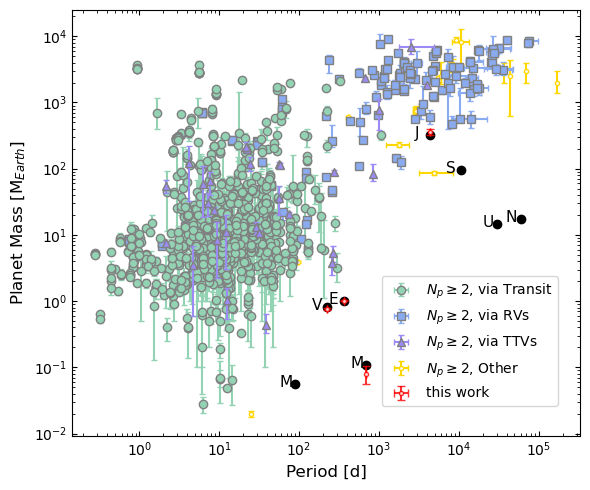

In [115]:
plot_systems(new_data,make_cut(new_data),"12/20/24",True) # masselimit=0 , no Msini measurements

Data accessed on  12/24/24


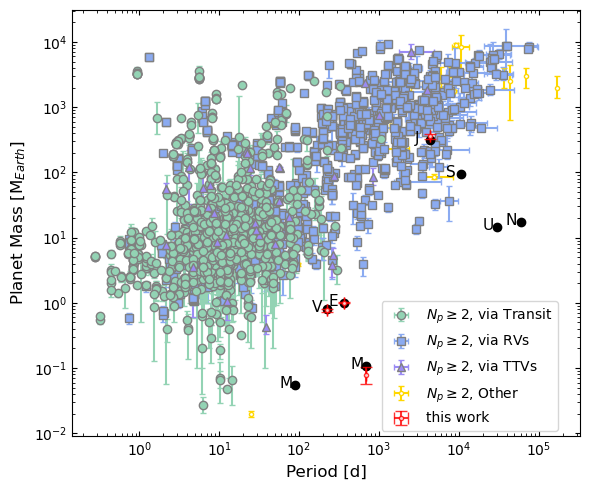

In [106]:
plot_systems(b_data,make_cut(b_data),"12/24/24")

In [2]:
import numpy as np
import rebound
import matplotlib.pyplot as plt

In [12]:
#astrophysical constants in CGS
GRAV=6.67384e-8
AU = 1.49598e13
PC = 3.08568025e18

MSUN = 1.98892e33
RSUN = 6.955e10

MEARTH = 5.9742e27
REARTH = 6.3781e8

MMOON = 7.342e25
RMOON = 1737.1e5
AMOON = 0.00257 # AU

MJUPITER = 1.8986e30
RJUPITER = 6.9911e9
AJUPITER = 4.84143144246472090 # AU

KILOGRAM = 1e3
METER = 1e2

# G=GRAV /1e3 #in MKS units
# AU=AU /1e2 #in MKS units
def calc_sma(Per,mu): # returns semi-major axis in AU
    mp=mu * (MSUN/MEARTH)/KILOGRAM
    mstar=MSUN/KILOGRAM
    a= (((GRAV/KILOGRAM)*(mstar + mp)* (Per*24*3600)**2) /(4*np.pi**2))**(1/3) 
    return a/(AU/1e2)
def calc_ecc(ecosom,esinom):
    return np.sqrt(ecosom**2 + esinom**2)
def calc_omega(ecosom,esinom):
    return np.arctan(esinom/ecosom)
def MMRs_overlap(a2,a1,mu2,mu1):
    sma_ratio=(a2 - a1)/a1
    if sma_ratio < 1.46*(mu1 + mu2)**(2/7):
        print("MMRs overlarp --> chaotic configuration")
        return True
    else: return False
def calc_Rhill(Per,mu,ecosom,esinom):
    ecc=calc_ecc(ecosom,esinom)
#     def Hill_radius(Per,mu,ecc):
    mp=mu * (MSUN/MEARTH)/KILOGRAM
    mstar=MSUN/KILOGRAM
    a = calc_sma(Per,mu)
    Hill_radius = (a * (1-ecc) * (mp/(3 * mstar))**(1/3))
    return Hill_radius
def mutual_Hill(Per1,mu1,Per2,mu2):  # returns mutual Hill radius in AU
    mp1=mu1 * (MSUN/MEARTH)/KILOGRAM
    mp2=mu2 * (MSUN/MEARTH)/KILOGRAM
    mstar=MSUN/KILOGRAM
    a1 = calc_sma(Per1,mu1);    a2 = calc_sma(Per2,mu2)
    return ((mp1 + mp2)/(3 * mstar))**(1/3) * (a1 + a2)/2

# def Hill_stability(μ, a, e, I) # input arrays of mu

In [110]:
np.array([2.5452514806996778e-6,2.938354131682856e-7,2.933151163231439e-7])*MSUN/MEARTH

array([0.84736058, 0.09782316, 0.09764994])

In [109]:
np.array([3.10658703046874e-6,1.0362878782161145e-7,1.0305464678911318e-7])*MSUN/MEARTH

array([1.03423941, 0.03449991, 0.03430877])

In [108]:
np.array([8.582495339894613e-5,9.304231194474255e-6,9.120456752760011e-6])*MSUN/MEARTH

array([28.57269029,  3.09754804,  3.03636618])

In [103]:
np.array([0.0007805546434104661, 0.00012398901850743476, 0.00011534586259462788])*MSUN/MEARTH

array([259.86085859,  41.27820272,  38.40073868])

In [94]:
planet_masses = [2.5452514806996778e-6,3.10658703046874e-6,8.582495339894613e-5,0.0007805546434104661]
planet_eccs=[0.00037316148837521765,0.013259865901709165,0.2614038172624099,0.039645546905058046]
planet_smas=[calc_sma(224.70077517395697,2.5452514806996778e-6),calc_sma(365.2564552605551,3.10658703046874e-6),calc_sma(1733.7614715994966,8.582495339894613e-5),calc_sma(4202.849483362612,0.0007805546434104661)]
def calc_AMD():
    val=0
    for iplanet in range(1,nplanet):
        mu_k=planet_masses
        a_k=planet_smas
        ecc_k=planet_eccs
        val+=(mu_k[iplanet]*np.sqrt(a_k[iplanet]) * (1-np.sqrt(1-ecc_k[iplanet]**2)))
        return val

In [95]:
calc_AMD()

2.7312666359329613e-10

AMD stable: given low ecc of planet d, it doenst have  a lot of AMD to give to planet e
if mass was lower, maybe more probable.

In [62]:
MMRs_overlap(calc_sma(1733.7614715994966,8.582495339894613e-5),calc_sma(365.2564552605551,3.10658703046874e-6),8.582495339894613e-5,3.10658703046874e-6)

False

In [61]:
mutual_Hill(1733.7614715994966,8.582495339894613e-5,365.2564552605551,3.10658703046874e-6)

3.261712920152008e-11

In [65]:
calc_Rhill(365.2564552605551,3.10658703046874e-6,0.013146866967261101,0.00172740634375595)

5.502035576030527e-12

In [66]:
calc_Rhill(1733.7614715994966,8.582495339894613e-5,0.26126214547436966,0.00860505790153028)

3.5164030039282766e-11

In [ ]:
# planet_masses = [2.5452514806996778e-6,3.10658703046874e-6,8.582495339894613e-5,0.0007805546434104661]
# star_masses = datafile["st_mass"] 
# semi_major_axes = datafile["pl_orbsmax"] 

# M_total_system_list = []
# hill_list = []
# for i in range(0, len(datafile)-1):
#     M = 0
#     index = 0
#     for r in datafile["hostname"]:
#         if r == datafile["hostname"][i]:
#             M += datafile["pl_bmasse"][index]
#         index += 1
#     M += datafile["st_mass"][i] * (0.33261191609863575142462501642665*(10**6))
#     if datafile["hostname"][i] == datafile["hostname"][i+1]:
#         hill_radius = ((planet_masses[i] + planet_masses[i+1])/(3*M))**(1/3) * ((semi_major_axes[i+1] + semi_major_axes[i])/2)
#         hill_list.append(hill_radius)
# hill_data = pd.Series(hill_list)
# hill_data = hill_data.dropna()
# hill_data = np.log10(hill_data)

# Plot Rebound orbits for most preferred configuration 

Text(0.5, 1.0, "Best-Fit Configuration, Ficticious 'Mars'")

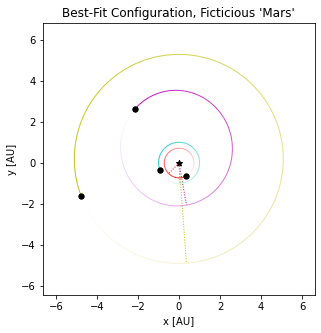

In [71]:
sim2 = rebound.Simulation()
sim2.units = ('AU', 'days', 'Msun')
sim2.add(m=1.0)
sim2.add(m=2.5452514806996778e-6, P=224.70077517395697,omega=calc_omega(3.7336627654746756e-5,-0.0003712889341763076),e=calc_ecc(3.7336627654746756e-5,-0.0003712889341763076))
sim2.add(m=3.10658703046874e-6, P=365.2564552605551,omega=calc_omega(3.7336627654746756e-5,-0.0003712889341763076),e=calc_ecc(0.013146866967261101,0.00172740634375595))
sim2.add(m=8.582495339894613e-5, P=1733.7614715994966,omega=calc_omega(3.7336627654746756e-5,-0.0003712889341763076),e=calc_ecc(0.26126214547436966,0.00860505790153028))
sim2.add(m=0.0007805546434104661, P=4202.849483362612,omega=calc_omega(3.7336627654746756e-5,-0.0003712889341763076),e=calc_ecc(0.013493684234908196,-0.03727854443469793))
sim2.integrate(100000)
# sim2.status()
op = rebound.OrbitPlot(sim2, unitlabel="[AU]", color=True, periastron=True)
os = sim2.calculate_orbits()
sim2.move_to_com()
plt.title("Best-Fit Configuration, Ficticious 'Mars'")
# plt.legend(handles=[("b","c","d","e")])

In [34]:
sim2.integrator = "whfast"
sim2.dt = 0.5 * os[1].P  # 5% of Io's period
Nout = 1000            # number of points to display
tmax = 1000000*365.25         # let the simulation run for N years

In [45]:
nplanets=4
x = np.zeros((nplanets,Nout))
y = np.zeros((nplanets,Nout))
ecc = np.zeros((nplanets,Nout))
longitude = np.zeros((nplanets,Nout))
omega = np.zeros((nplanets,Nout))
sma=np.zeros((nplanets,Nout))

times = np.linspace(0.,tmax,Nout)
ps = sim2.particles

for i,time in enumerate(times):
    sim2.integrate(time)
    # note we use integrate() with the default exact_finish_time=1, which changes the timestep near 
    # the outputs to match the output times we want.  This is what we want for a Fourier spectrum, 
    # but technically breaks WHFast's symplectic nature.  Not a big deal here.
    os = sim2.calculate_orbits()
    for j in range(nplanets):
        x[j][i] = ps[j+1].x 
        y[j][i] = ps[j+1].y 
        ecc[j][i] = os[j].e
        sma[j][i] = os[j].a
        longitude[j][i] = os[j].l
        omega[j][i] = os[j].omega
#         varpi[j][i] = os[j].Omega + os[j].omega

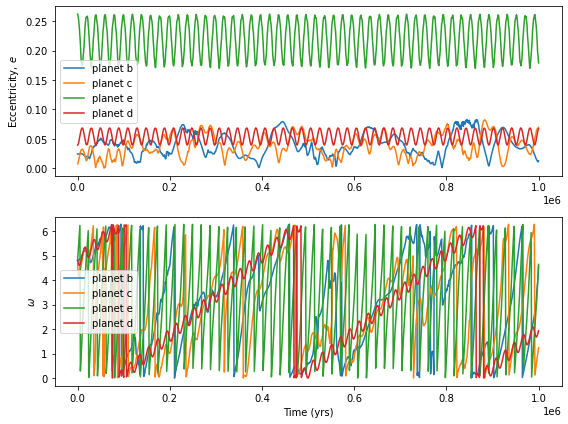

In [53]:
fig = plt.figure(figsize=(8,6))
ax1 = plt.subplot(211)
plt.plot(times/365.25,ecc[0],label="planet b")
plt.plot(times/365.25,ecc[1],label="planet c")
plt.plot(times/365.25,ecc[2],label="planet e")
plt.plot(times/365.25,ecc[3],label="planet d")
# ax1.set_xlabel("Time (yrs)")
ax1.set_ylabel("Eccentricity, $e$")
# ax1.set_xlim(0,10000)
plt.legend();
# ax2 = plt.subplot(312,sharex=ax1)
# plt.plot(times/365.25,sma[0],label="planet b")
# plt.plot(times/365.25,sma[1],label="planet c")
# plt.plot(times/365.25,sma[2],label="planet e")
# plt.plot(times/365.25,sma[3],label="planet d")
# ax2.set_xlabel("Time (yrs)")
ax3 = plt.subplot(212)
plt.plot(times/365.25,omega[0],label="planet b")
plt.plot(times/365.25,omega[1],label="planet c")
plt.plot(times/365.25,omega[2],label="planet e")
plt.plot(times/365.25,omega[3],label="planet d")
plt.legend();
ax3.set_xlabel("Time (yrs)")
ax3.set_ylabel("$ω$")
fig.tight_layout()

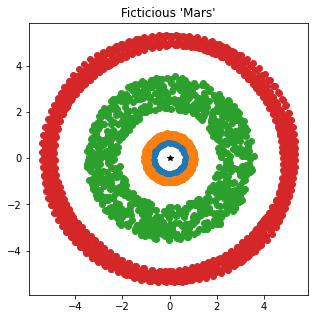

In [52]:
fig=plt.figure(figsize=(5,5))
plt.title("Ficticious 'Mars'")
plt.plot(0,0, marker='*', color = "k")
plt.scatter(x[0],y[0],label="planet b")
plt.scatter(x[1],y[1],label="planet c")
plt.scatter(x[2],y[2],label="planet e")
plt.scatter(x[3],y[3],label="planet d")

/opt/anaconda3/lib/python3.9/site-packages/rebound/simulation.py:1033: RuntimeWarning: WHFast convergence issue. Timestep is larger than at least one orbital period.
  warnings.warn(msg[1:], RuntimeWarning)
/var/folders/zr/tkhyjcmx4nz38cdkm50wgz3c0000gn/T/ipykernel_11325/569921383.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(5,5))


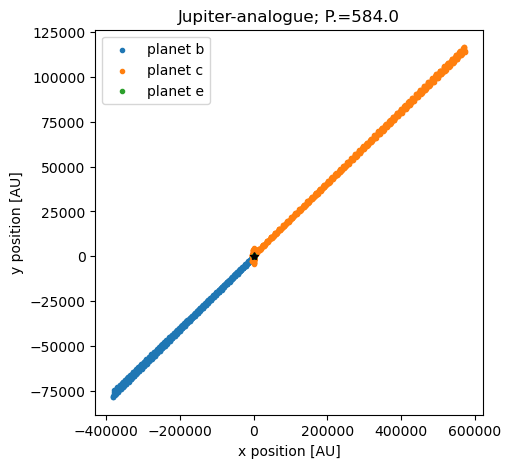

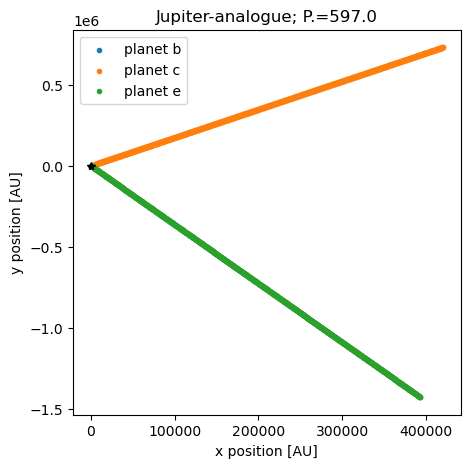

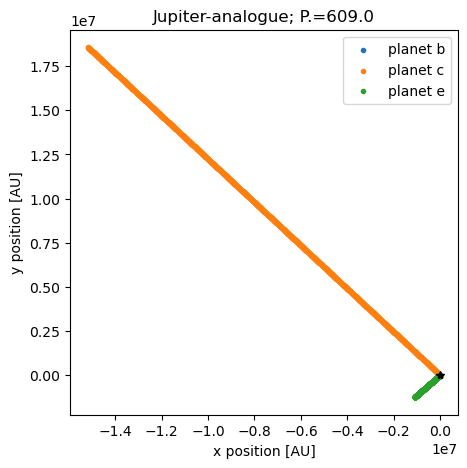

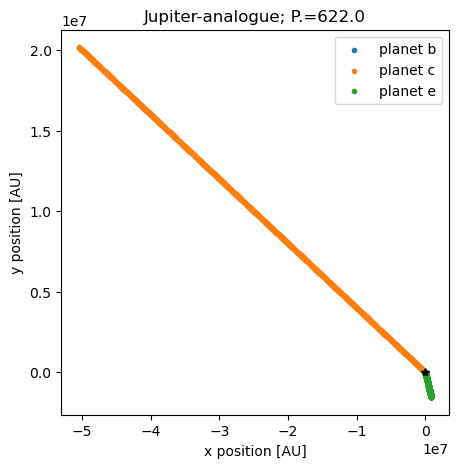

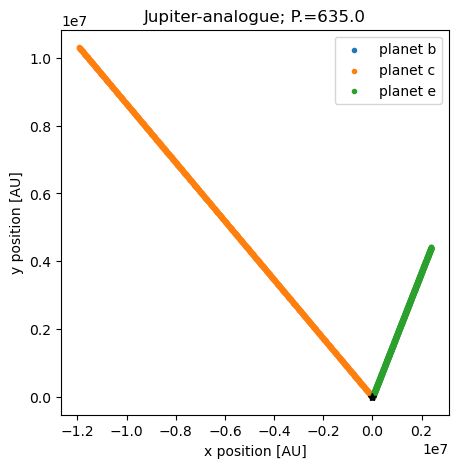

...

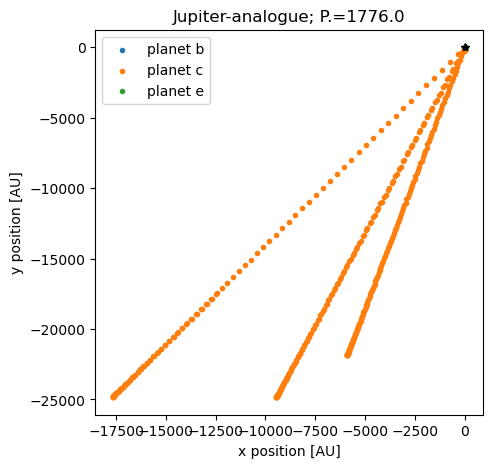

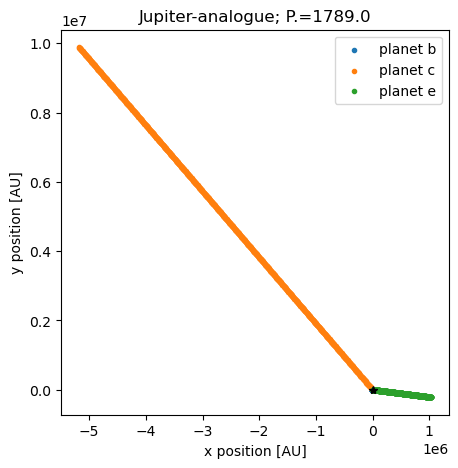

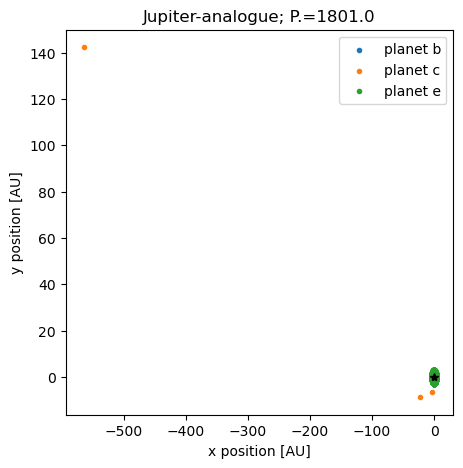

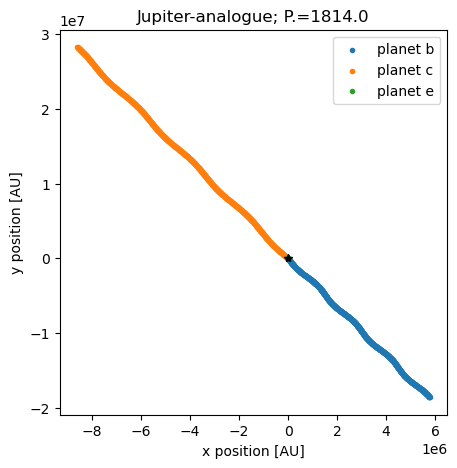

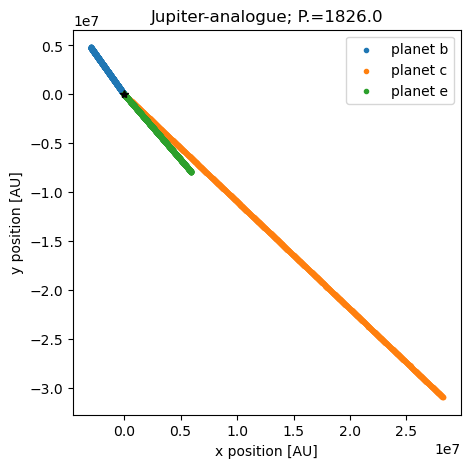

In [14]:
periods=np.linspace(584.4, 1826.25,100)
def Find_MinJup(P3):
    Noutputs=1000
    times = np.linspace(0,1000000*365.25,Noutputs)
    x = np.zeros((3,Noutputs))
    y = np.zeros((3,Noutputs))
    z = np.zeros((3,Noutputs))
    sim = rebound.Simulation()
    sim.units = ('AU', 'days', 'Msun')
    sim.add(m=1.0)
    sim.add(m=4.2918e-6,P=224.70077517395697,omega=calc_omega(-0.027,-0.039),e=calc_ecc(-0.027,-0.039))
    sim.add(m=2.8450e-6,P=365.2564552605551,omega=calc_omega(-0.00461,-0.02945),e=calc_ecc(-0.00461,-0.02945))
    sim.add(m=0.001, P=P3,omega=calc_omega(-0.07663,0.02077),e=calc_ecc(-0.07663,0.02077))
    sim.integrator = "whfast"
    os = sim.calculate_orbits()
    sim.dt = 0.5 * os[1].P
    sim.move_to_com()
    particles = sim.particles
    for i,time in enumerate(times):
        sim.integrate(time, exact_finish_time=0)
        x[0][i] = particles[1].x
        y[0][i] = particles[1].y
        x[1][i] = particles[2].x
        y[1][i] = particles[2].y
        x[2][i] = particles[3].x
        y[2][i] = particles[3].y

    fig = plt.figure(figsize=(5,5))
    ax = plt.subplot(111)
    plt.title("Jupiter-analogue; P.="+ str(np.round(P3)))
    plt.plot(0,0, marker='*', color = "k")
    plt.scatter(x[0],y[0], marker='.', label = "planet b");
    plt.scatter(x[1],y[1], marker='.', label = "planet c");
    plt.scatter(x[2],y[2], marker='.', label = "planet d");
    plt.legend()
    plt.xlabel("x position [AU]")
    plt.ylabel("y position [AU]")

for per in periods:
    Find_MinJup(per)

In [3]:
eccentricities = np.linspace(0.15,0.3,100) #ignore warning
def RunSim_Find_eccInst(ecc_p3):
    Noutputs = 10000
    times = np.linspace(0,1000000*365.25,Noutputs)
    x = np.zeros((4,Noutputs))
    y = np.zeros((4,Noutputs))
    z = np.zeros((4,Noutputs))
    sim = rebound.Simulation()
    sim.units = ('AU', 'days', 'Msun')
    sim.add(m=1.0)
    sim.add(m=2.5452514806996778e-6, P=224.70077517395697,omega=calc_omega(3.7336627654746756e-5,-0.0003712889341763076),e=calc_ecc(3.7336627654746756e-5,-0.0003712889341763076))
    sim.add(m=3.10658703046874e-6, P=365.2564552605551,omega=calc_omega(3.7336627654746756e-5,-0.0003712889341763076),e=calc_ecc(0.013146866967261101,0.00172740634375595))
    sim.add(m=8.582495339894613e-5, P=1733.7614715994966,e=ecc_p3)
    sim.add(m=0.0007805546434104661, P=4202.849483362612,omega=calc_omega(3.7336627654746756e-5,-0.0003712889341763076),e=calc_ecc(0.013493684234908196,-0.03727854443469793))
    sim.integrator = "whfast"
    sim.dt = 0.5 * os[1].P
    sim.move_to_com()
    particles = sim.particles
    for i,time in enumerate(times):
        sim.integrate(time, exact_finish_time=0)
        x[0][i] = particles[1].x
        y[0][i] = particles[1].y
        x[1][i] = particles[2].x
        y[1][i] = particles[2].y
        x[2][i] = particles[3].x
        y[2][i] = particles[3].y
        x[3][i] = particles[4].x
        y[3][i] = particles[4].y

    fig = plt.figure(figsize=(5,5))
    ax = plt.subplot(111)
    plt.title("Ficticious 'Mars'; Ecc.="+ str(np.round(ecc_p3)))
    plt.plot(0,0, marker='*', color = "k")
    plt.scatter(x[0],y[0], marker='.', label = "planet b");
    plt.scatter(x[1],y[1], marker='.', label = "planet c");
    plt.scatter(x[2],y[2], marker='.', label = "planet e");
    plt.scatter(x[3],y[3], marker='.', label = "planet d");
#     plt.plot(x[2],x[2],color="black",alpha=0.5)
#     plt.ylim((-0.5,0.5))
#     plt.xlim((-0.5,0.5))
    plt.legend()
    plt.xlabel("x position [AU]")
    plt.ylabel("y position [AU]")

/var/folders/zr/tkhyjcmx4nz38cdkm50wgz3c0000gn/T/ipykernel_17958/3246487368.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(5,5))


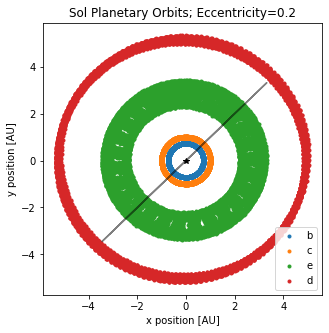

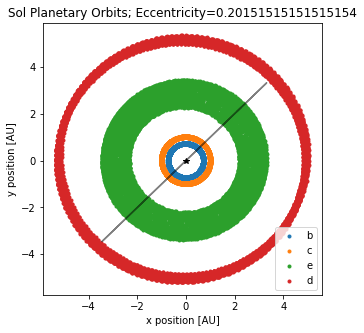

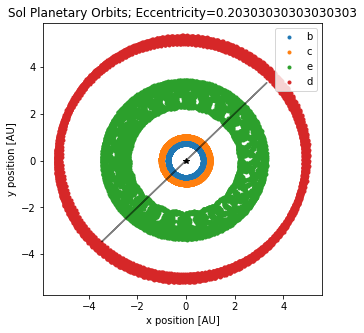

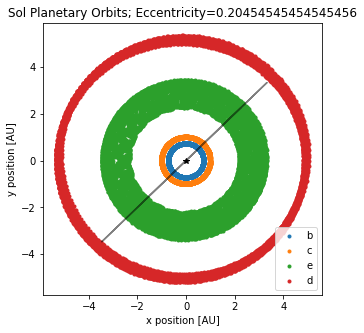

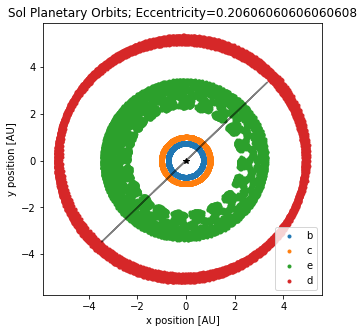

...

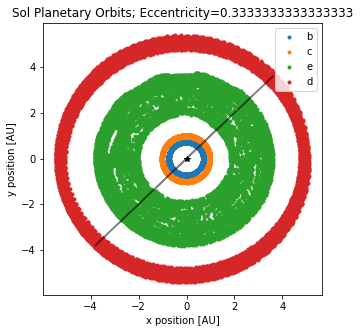

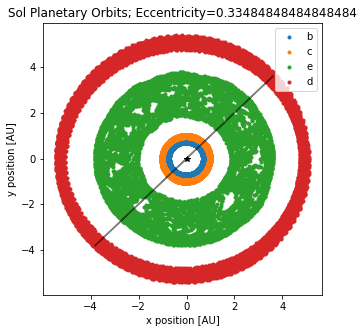

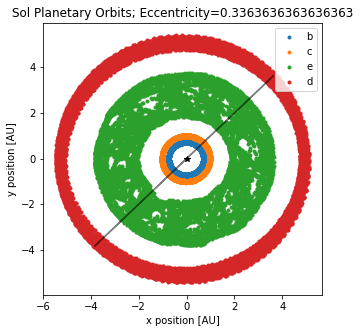

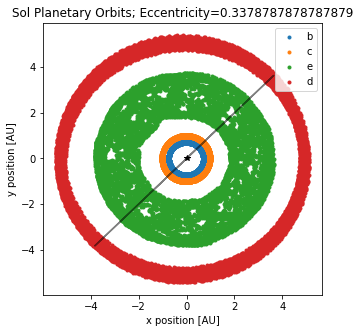

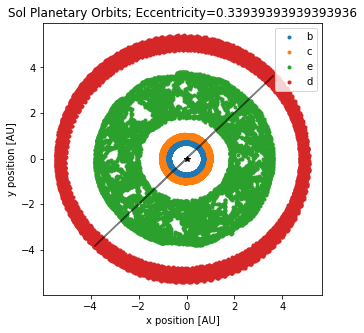

/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


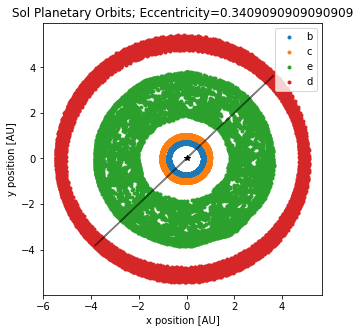

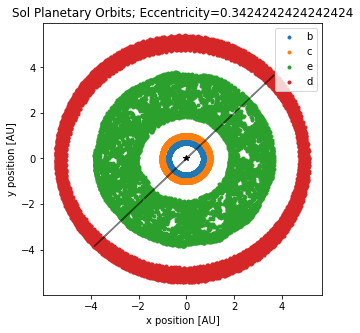

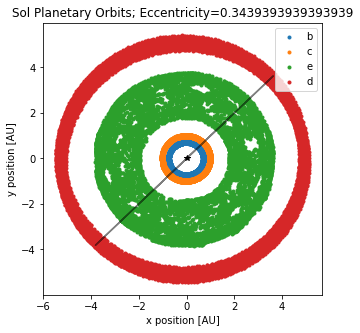

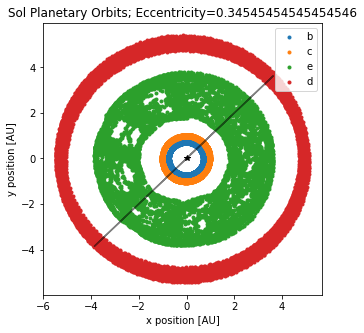

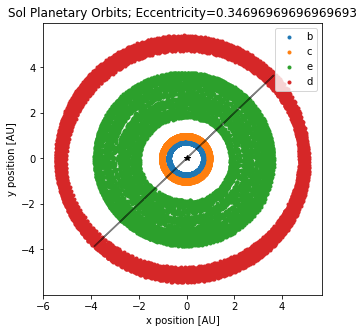

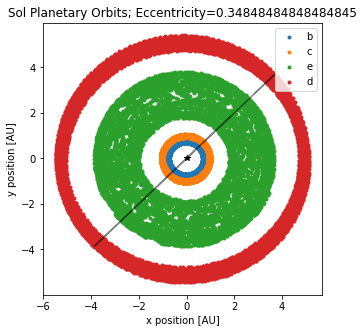

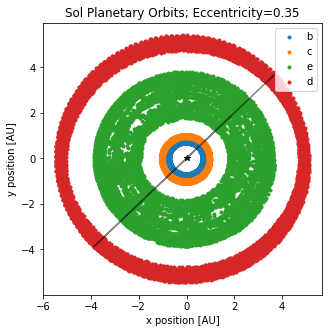

In [22]:
# for ecc in eccentricities:
#     RunSim_Find_eccInst(ecc)

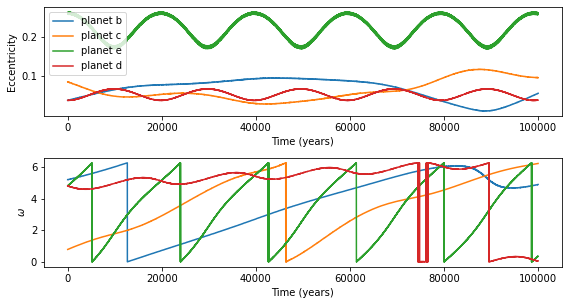

In [103]:
fig = plt.figure(figsize=(8,6))
ax1 = plt.subplot(311)
plt.plot(times/365.25,ecc[0],label="planet b")
plt.plot(times/365.25,ecc[1],label="planet c")
plt.plot(times/365.25,ecc[2],label="planet e")
plt.plot(times/365.25,ecc[3],label="planet d")
ax1.set_xlabel("Time (years)")
ax1.set_ylabel("Eccentricity")
# ax1.set_xlim(0,10000)
plt.legend();
ax2 = plt.subplot(312,sharex=ax1)
# plt.plot(times/365.25,sma[0],label="planet b")
# plt.plot(times/365.25,sma[1],label="planet c")
# plt.plot(times/365.25,sma[2],label="planet e")
# plt.plot(times/365.25,sma[3],label="planet d")
# ax2.set_xlabel("Time (years)")
# ax3 = plt.subplot(313)
plt.plot(times/365.25,omega[0],label="planet b")
plt.plot(times/365.25,omega[1],label="planet c")
plt.plot(times/365.25,omega[2],label="planet e")
plt.plot(times/365.25,omega[3],label="planet d")
ax2.set_xlabel("Time (years)")
ax2.set_ylabel("$ω$")
fig.tight_layout()

Find $\phi_0$ , initial lunar phase wrt to Earth

In [110]:
# We can add objects by name, since REBOUND is linked to the HORIZONS database.
labels = ["Sun","Venus","Earth","Mars","Jupiter"]
sim = rebound.Simulation()
sim.units = ('AU', 'days', 'Msun')
sim.add(labels)
# os = sim.calculate_orbits()
nplanets=4
nyears= 100
sim.integrator = "whfast"
sim.dt = 0.5 * os[1].P  # 5% of inner planet's period
Nout = 10000            # number of points to display
tmax = nyears*365.25         # let the simulation run for given number of years
x = np.zeros((nplanets,Nout))
ecc = np.zeros((nplanets,Nout))
longitude = np.zeros((nplanets,Nout))
omega = np.zeros((nplanets,Nout))
sma=np.zeros((nplanets,Nout))

times = np.linspace(0.,tmax,Nout)
ps = sim.particles

for i,time in enumerate(times):
    sim.integrate(time)
    # note we use integrate() with the default exact_finish_time=1, which changes the timestep near 
    # the outputs to match the output times we want.  This is what we want for a Fourier spectrum, 
    # but technically breaks WHFast's symplectic nature.  Not a big deal here.
    os = sim.calculate_orbits()
    for j in range(nplanets):
        x[j][i] = ps[j+1].x 
        ecc[j][i] = os[j].e
        sma[j][i] = os[j].a
        longitude[j][i] = os[j].l
        omega[j][i] = os[j].omega
#         varpi[j][i] = os[j].Omega + os[j].omega

Searching NASA Horizons for 'Sun'... 
Found: Sun (10) 
Searching NASA Horizons for 'Venus'... 
Found: Venus Barycenter (299) (chosen from query 'Venus')
Searching NASA Horizons for 'Earth'... 
Found: Earth-Moon Barycenter (3) (chosen from query 'Earth')
Searching NASA Horizons for 'Moon'... 
Found: Earth-Moon Barycenter (3) (chosen from query 'Moon')
Searching NASA Horizons for 'Mars'... 
Found: Mars Barycenter (4) (chosen from query 'Mars')
Searching NASA Horizons for 'Jupiter'... 
Found: Jupiter Barycenter (5) (chosen from query 'Jupiter')


### Finding TTVs with Rebound

In [72]:
N=20
transittimes = np.zeros(N)
p = sim.particles
i = 0
while i<N:
    y_old = p[1].y - p[0].y 
    t_old = sim.t
    sim.integrate(sim.t+0.5) # check for transits every 0.5 time units. Note that 0.5 is shorter than one orbit
    t_new = sim.t
    if y_old*(p[1].y-p[0].y)<0. and p[1].x-p[0].x>0.:   # sign changed (y_old*y<0), planet in front of star (x>0)
        while t_new-t_old>1e-7:   # bisect until prec of 1e-5 reached
            if y_old*(p[1].y-p[0].y)<0.:
                t_new = sim.t
            else:
                t_old = sim.t
            sim.integrate( (t_new+t_old)/2.)
        transittimes[i] = sim.t
        i += 1
        sim.integrate(sim.t+0.05)       # integrate 0.05 to be past the transit
        
A = np.vstack([np.ones(N), range(N)]).T
c, m = np.linalg.lstsq(A, transittimes, rcond=-1)[0] # remove linear trend

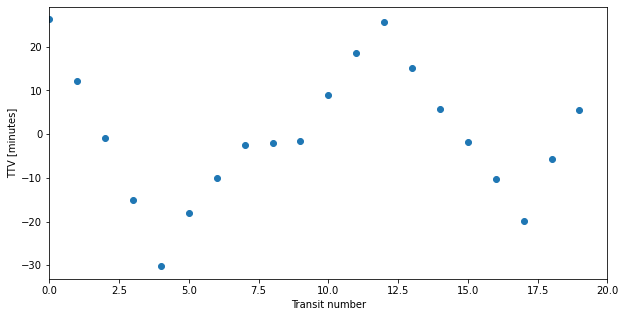

In [73]:
%matplotlib inline
fig = plt.figure(figsize=(10,5))
ax = plt.subplot(111)
ax.set_xlim([0,N])
ax.set_xlabel("Transit number")
ax.set_ylabel("TTV [minutes]")
plt.scatter(range(N), (transittimes-m*np.array(range(N))-c)*(24.*365./2./np.pi));